In [112]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

from copy import deepcopy

# Image Correction

## Histograms for RGB, Grayscale, YCbCr, HSV, XYZ and Lab color models

### Image `HMRegistred.png`

In [113]:
img = cv2.imread('data/HMRegistred.png')
img.dtype

dtype('uint8')

In [114]:
# img = cv2.imread('data/HMRegistred.png').astype(np.float32)
# img = img/255
# img.dtype

In [115]:
def plot_colour_schemes(img, labels, range=[[0, 255], [0, 255], [0, 255]], bins=256, use_rgb=True, plots=4):
    fig, axs = plt.subplots(2, plots, figsize=(20, 10))
    
    if use_rgb:
        axs[0][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else: 
        axs[0][0].imshow(img)
    axs[0][0].axis('off')

    for i, c in enumerate(labels):
        axs[0][i+1].imshow(img[:, :, i], cmap='gray') 
        axs[0][i+1].axis('off')
        axs[0][i+1].set_title(c)

    first_hist = cv2.calcHist([img], [0], None, [bins], range[0])
    second_hist = cv2.calcHist([img], [1], None, [bins], range[1])
    third_hist = cv2.calcHist([img], [2], None, [bins], range[2])

    axs[1][0].plot(first_hist, color='r')
    axs[1][0].plot(second_hist, color='g')
    axs[1][0].plot(third_hist, color='b')
    
    axs[1][1].plot(first_hist)
    axs[1][2].plot(second_hist)
    axs[1][3].plot(third_hist)

    return (first_hist, second_hist, third_hist)

(6000, 6000, 3)


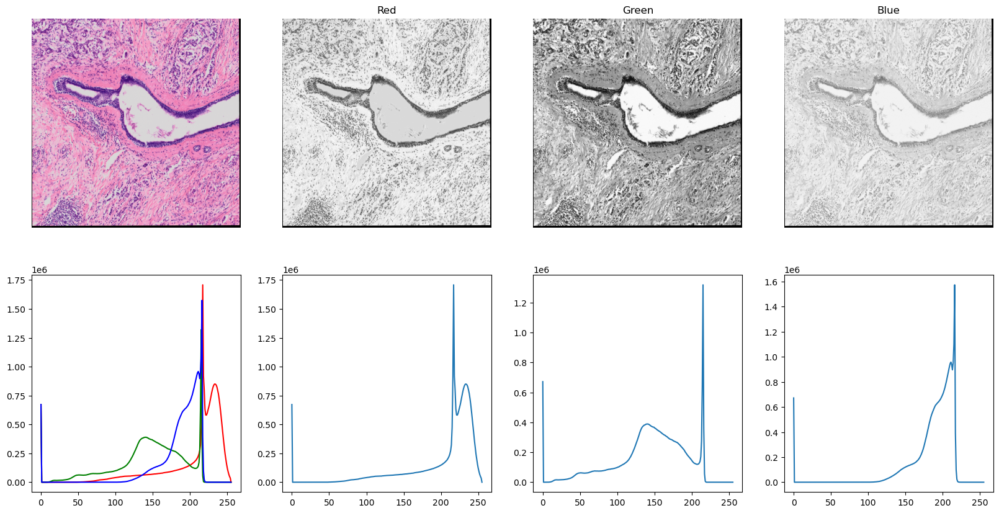

In [116]:
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(imgRGB.shape)
# imgRGB = img

r_hist, g_hist, b_hist = plot_colour_schemes(imgRGB, ['Red', 'Green', 'Blue'], use_rgb=False)

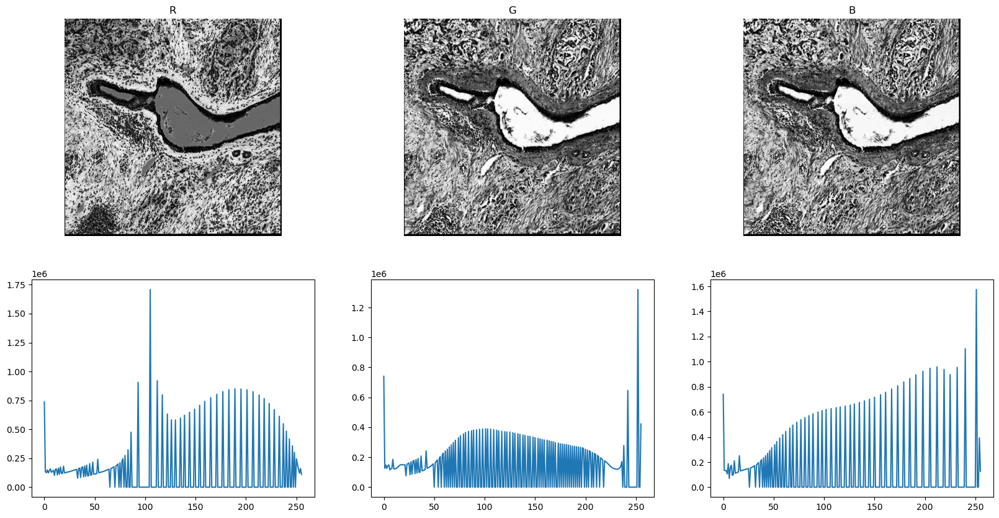

In [117]:
r_e = cv2.equalizeHist(imgRGB[:, :, 0])
g_e = cv2.equalizeHist(imgRGB[:, :, 1])
b_e = cv2.equalizeHist(imgRGB[:, :, 2])

r_ehist = cv2.calcHist([r_e], [0], None, [256], [0, 255])
g_ehist = cv2.calcHist([g_e], [0], None, [256], [0, 255])
b_ehist = cv2.calcHist([b_e], [0], None, [256], [0, 255])

fig, axs = plt.subplots(2, 3, figsize=(20, 10))
axs[0][0].imshow(r_e, cmap='gray')
axs[0][0].set_title('R')
axs[0][0].axis('off')
axs[0][1].imshow(g_e, cmap='gray')
axs[0][1].set_title('G')
axs[0][1].axis('off')
axs[0][2].imshow(b_e, cmap='gray')
axs[0][2].set_title('B')
axs[0][2].axis('off')

axs[1][0].plot(r_ehist)
axs[1][1].plot(g_ehist)
axs[1][2].plot(b_ehist)

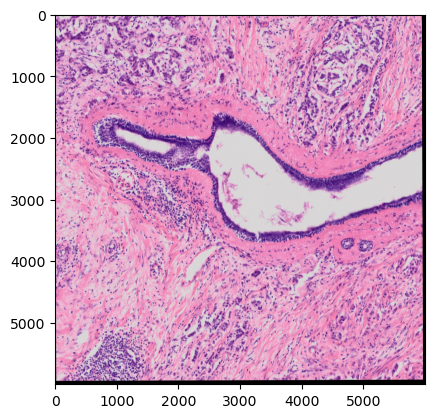

In [132]:
newRGB = np.stack([imgRGB[:,:,0], imgRGB[:,:,1], imgRGB[:,:,2]], axis=-1)
plt.imshow(newRGB)

(6000, 6000)


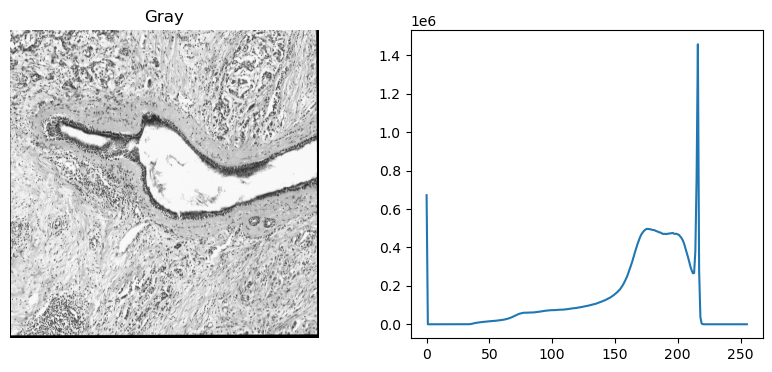

In [118]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print(gray.shape)

hist = cv2.calcHist([gray], [0], None, [256], [0, 255])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(gray, cmap='gray')
ax1.set_title('Gray')
ax1.axis('off')
ax2.plot(hist)

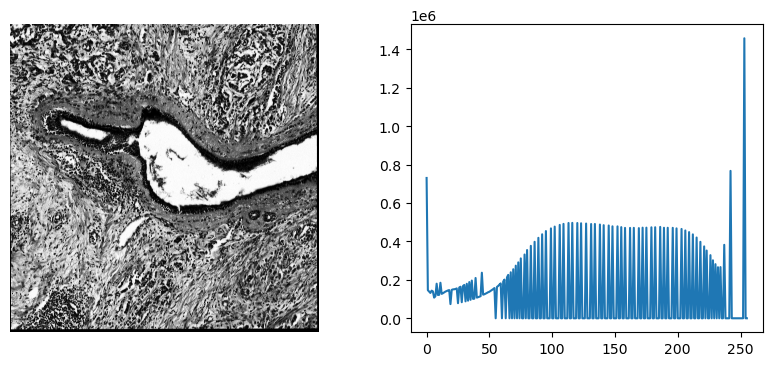

In [136]:
gray_e = cv2.equalizeHist(gray)
gray_ehist = cv2.calcHist([gray_e], [0], None, [256], [0, 255])

fig, axs = plt.subplots(1, 2, figsize=(10, 4))
axs[0].imshow(gray_e, cmap='gray')
# axs[0].set_title('R')
axs[0].axis('off')
axs[1].plot(gray_ehist)
# axs[1].set_title('G')

(6000, 6000, 3)


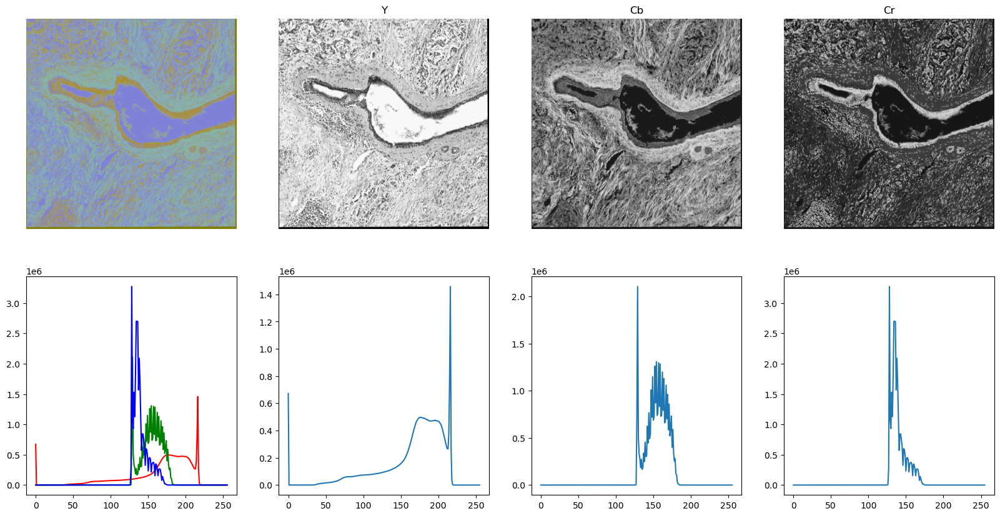

In [119]:
imgYCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
print(imgYCrCb.shape)

_, _, _ = plot_colour_schemes(imgYCrCb, ['Y', 'Cb', 'Cr'])

(6000, 6000, 3)


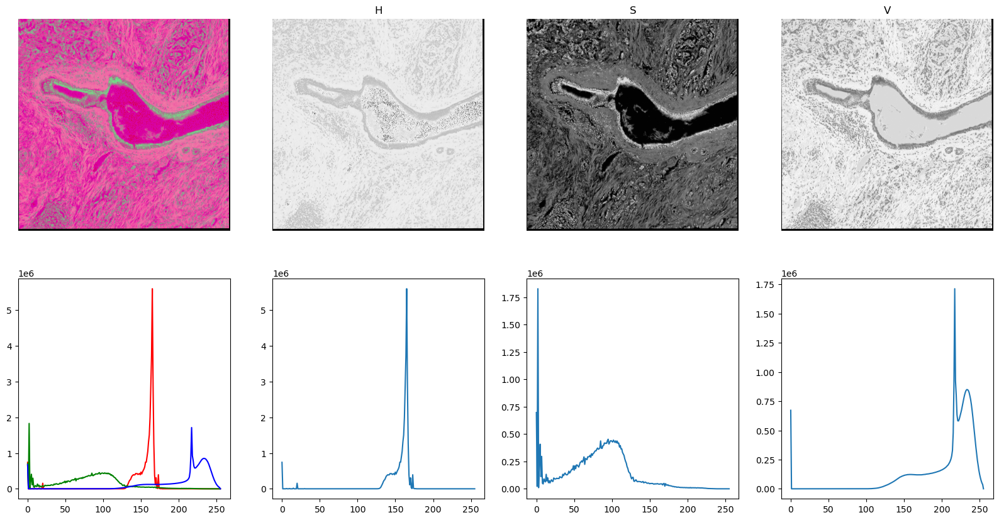

In [120]:
imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
print(imgHSV.shape)

_, _, _ = plot_colour_schemes(imgHSV, ['H', 'S', 'V'])

(6000, 6000, 3)


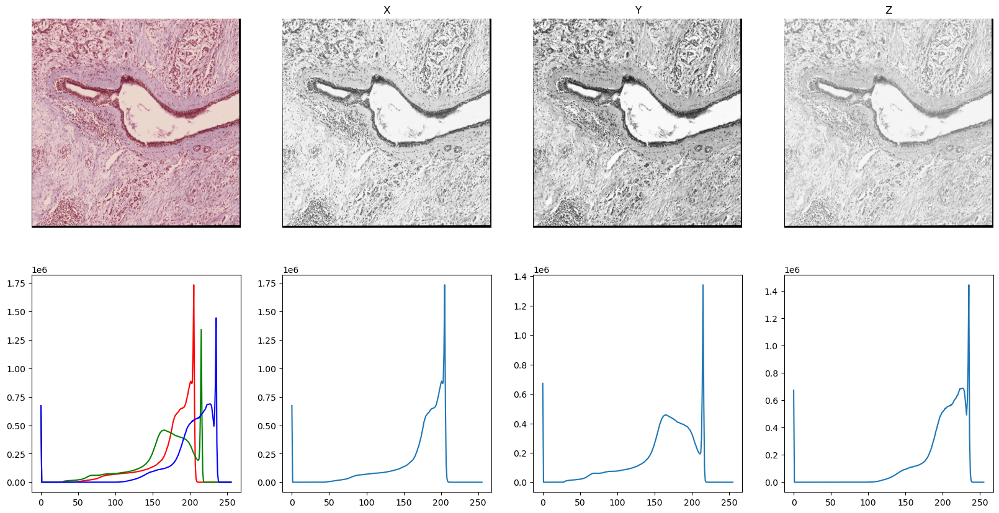

In [121]:
imgXYZ = cv2.cvtColor(img, cv2.COLOR_BGR2XYZ)
print(imgXYZ.shape)

_, _, _ = plot_colour_schemes(imgXYZ, ['X', 'Y', 'Z'])

(6000, 6000, 3)


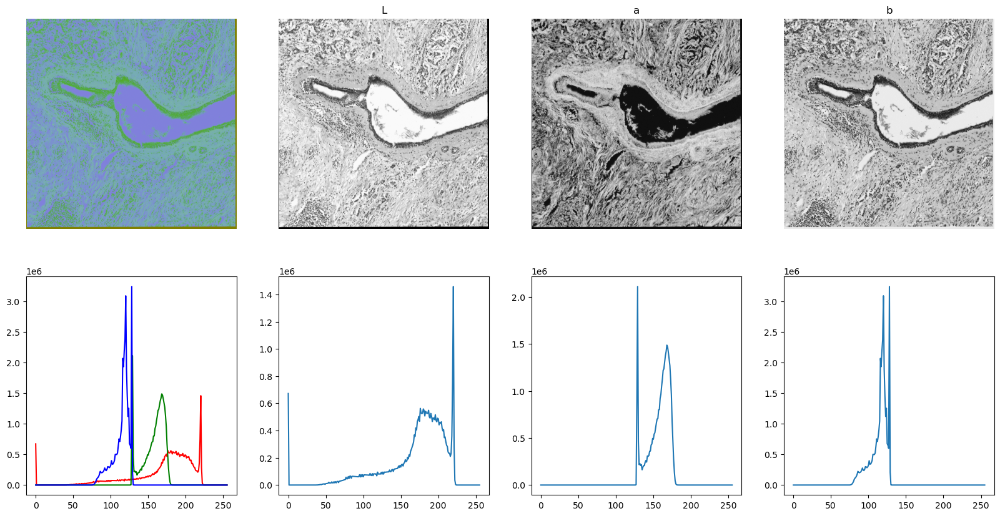

In [122]:
imgLab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
print(imgLab.shape)

_, _, _ = plot_colour_schemes(imgLab, ['L', 'a', 'b'])

Lab in different data range

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(6000, 6000, 3)


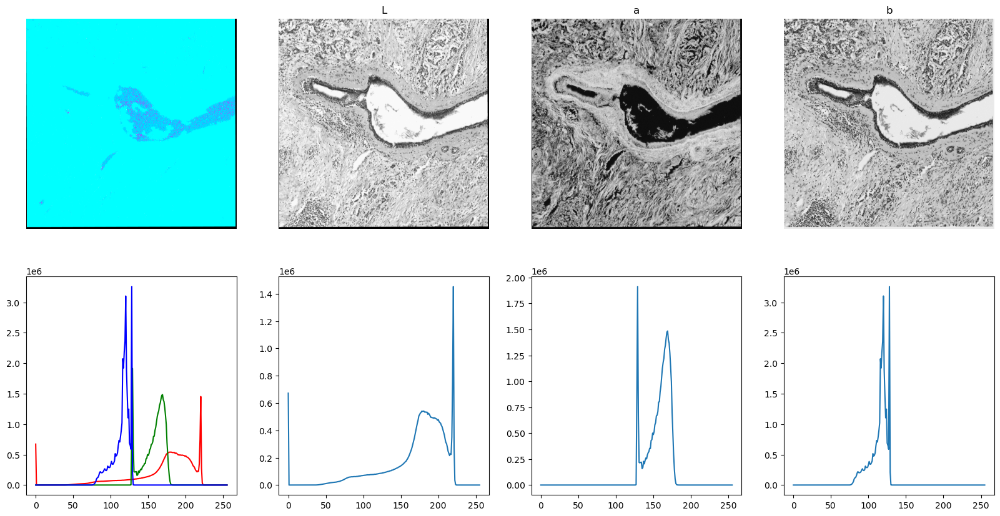

In [123]:
imgLab = cv2.cvtColor(img.astype(np.float32)/255, cv2.COLOR_BGR2Lab)
print(imgLab.shape)

_, _, _ = plot_colour_schemes(imgLab, ['L', 'a', 'b'], range=[[0, 100], [-128, 127], [-128, 127]])

### Image `P63Registred.png`

In [138]:
img = cv2.imread('data/P63Registred.png')
img.dtype

dtype('uint8')

(6000, 6000, 3)


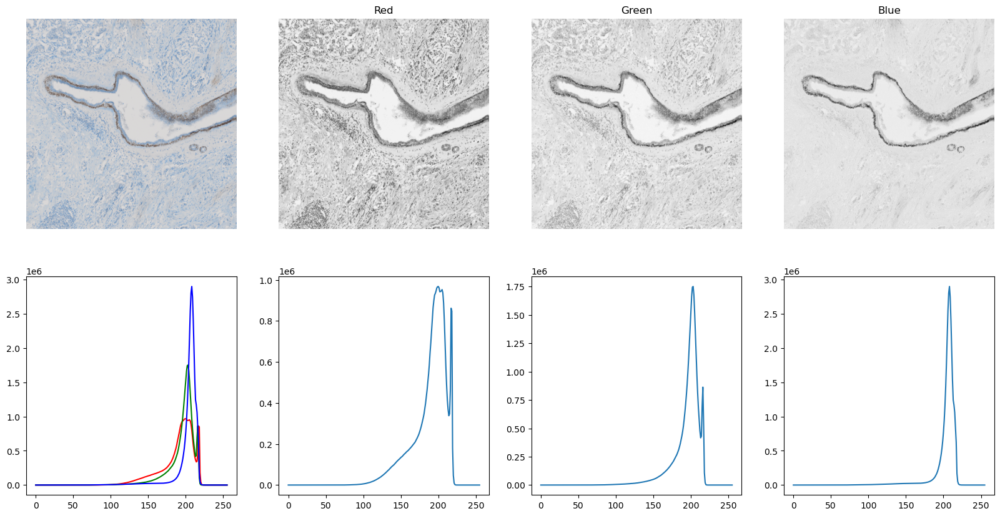

In [139]:
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(imgRGB.shape)
# imgRGB = img

r_hist, g_hist, b_hist = plot_colour_schemes(imgRGB, ['Red', 'Green', 'Blue'], use_rgb=False)

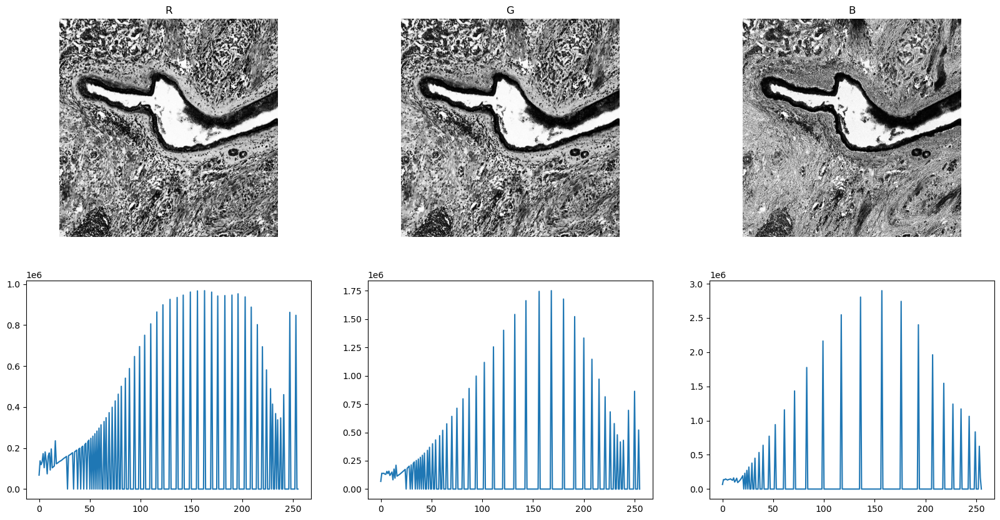

In [140]:
r_e = cv2.equalizeHist(imgRGB[:, :, 0])
g_e = cv2.equalizeHist(imgRGB[:, :, 1])
b_e = cv2.equalizeHist(imgRGB[:, :, 2])

r_ehist = cv2.calcHist([r_e], [0], None, [256], [0, 255])
g_ehist = cv2.calcHist([g_e], [0], None, [256], [0, 255])
b_ehist = cv2.calcHist([b_e], [0], None, [256], [0, 255])

fig, axs = plt.subplots(2, 3, figsize=(20, 10))
axs[0][0].imshow(r_e, cmap='gray')
axs[0][0].set_title('R')
axs[0][0].axis('off')
axs[0][1].imshow(g_e, cmap='gray')
axs[0][1].set_title('G')
axs[0][1].axis('off')
axs[0][2].imshow(b_e, cmap='gray')
axs[0][2].set_title('B')
axs[0][2].axis('off')

axs[1][0].plot(r_ehist)
axs[1][1].plot(g_ehist)
axs[1][2].plot(b_ehist)

(6000, 6000)


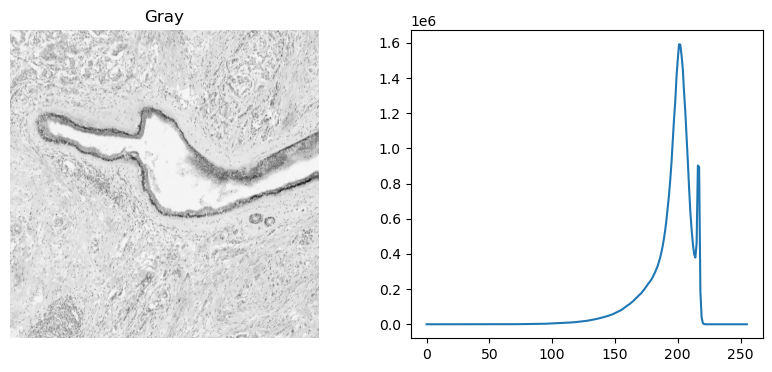

In [141]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print(gray.shape)

hist = cv2.calcHist([gray], [0], None, [256], [0, 255])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(gray, cmap='gray')
ax1.set_title('Gray')
ax1.axis('off')
ax2.plot(hist)

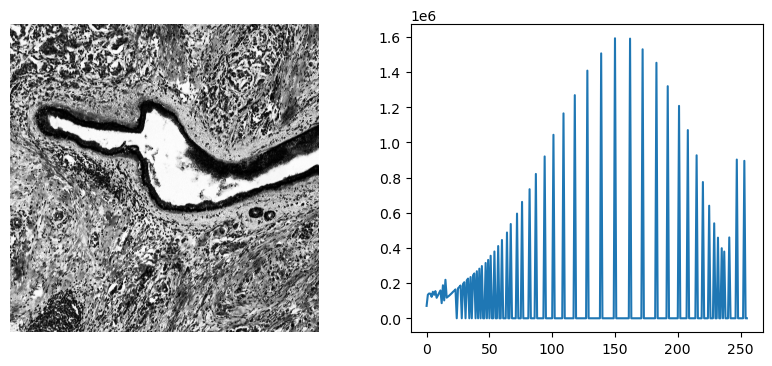

In [142]:
gray_e = cv2.equalizeHist(gray)
gray_ehist = cv2.calcHist([gray_e], [0], None, [256], [0, 255])

fig, axs = plt.subplots(1, 2, figsize=(10, 4))
axs[0].imshow(gray_e, cmap='gray')
# axs[0].set_title('R')
axs[0].axis('off')
axs[1].plot(gray_ehist)
# axs[1].set_title('G')

(6000, 6000, 3)


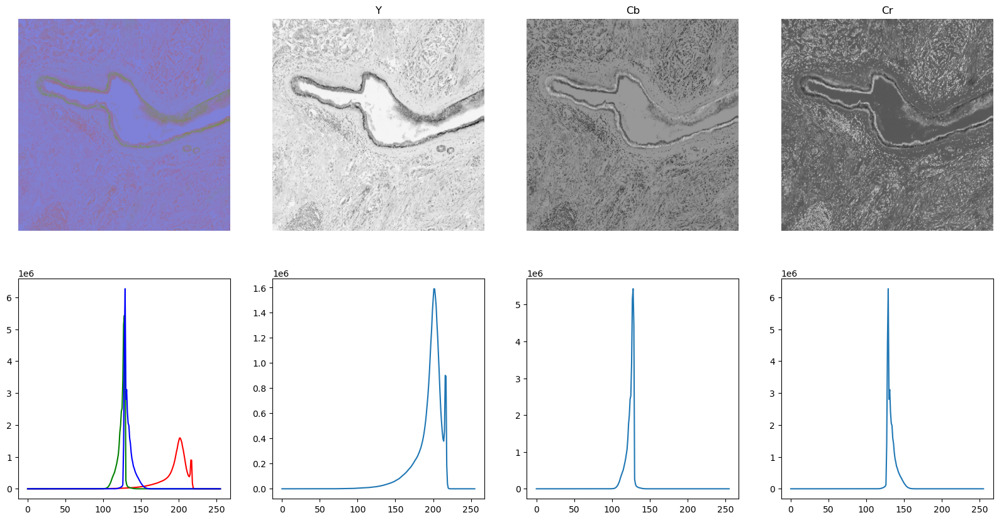

In [143]:
imgYCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
print(imgYCrCb.shape)

_, _, _ = plot_colour_schemes(imgYCrCb, ['Y', 'Cb', 'Cr'])

(6000, 6000, 3)


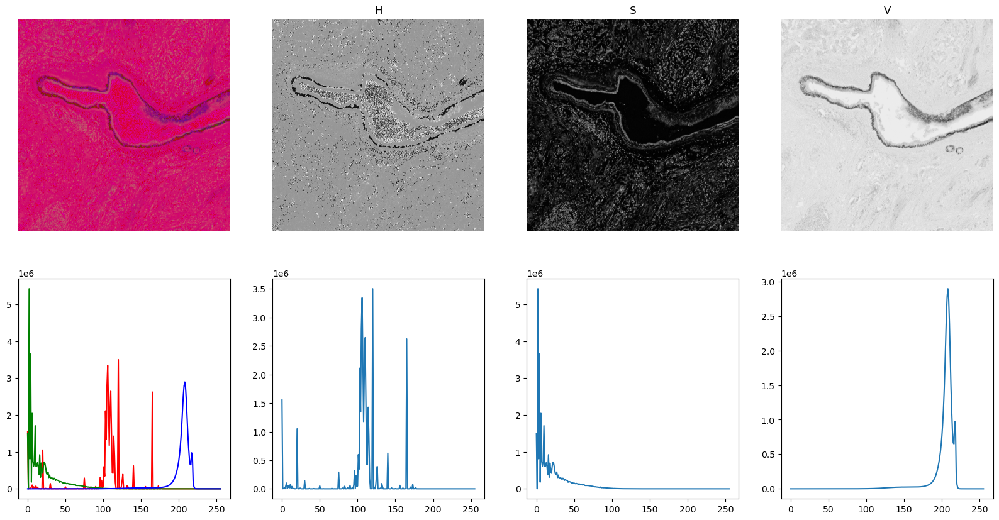

In [144]:
imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
print(imgHSV.shape)

_, _, _ = plot_colour_schemes(imgHSV, ['H', 'S', 'V'])

(6000, 6000, 3)


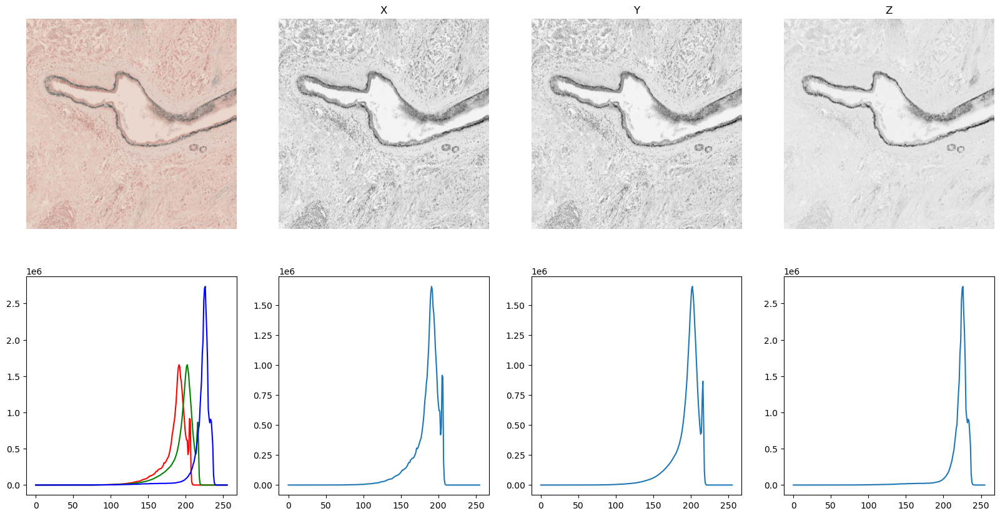

In [145]:
imgXYZ = cv2.cvtColor(img, cv2.COLOR_BGR2XYZ)
print(imgXYZ.shape)

_, _, _ = plot_colour_schemes(imgXYZ, ['X', 'Y', 'Z'])

(6000, 6000, 3)


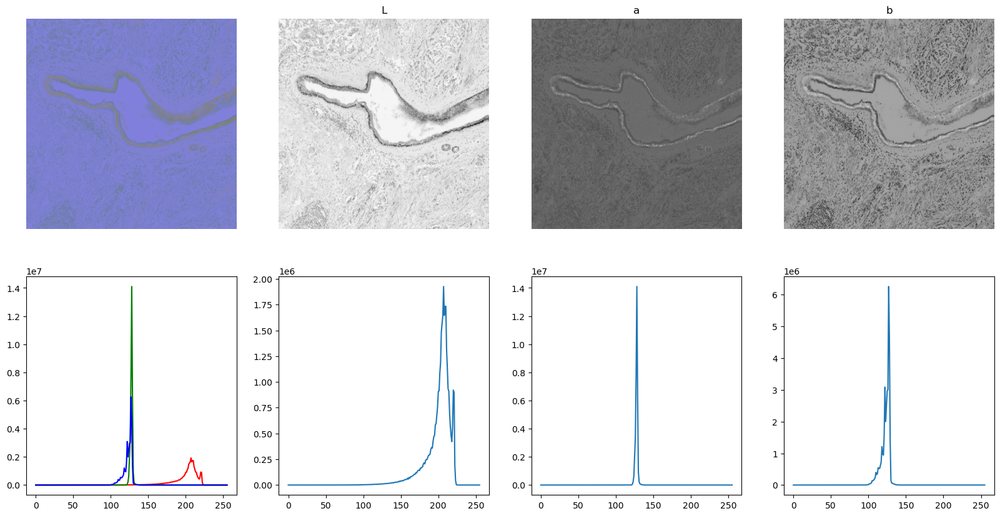

In [146]:
imgLab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
print(imgLab.shape)

_, _, _ = plot_colour_schemes(imgLab, ['L', 'a', 'b'])